In [ ]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
from os import listdir
from PIL import Image
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread
import os
%matplotlib inline
import sys
if (os.getcwd().split("/")[-1]=="evaluation"):
    os.chdir("../")
import subprocess
import importlib
import shutil
import gc
import random
from utils import change_active_config, copy_n_rand_patches
from evaluation import read_tensor_from_image_file, load_graph, load_labels
import constants

In [2]:
import time, sys
from IPython.display import clear_output

def update_progress(progress):
    bar_length = 20
    if isinstance(progress, int):
        progress = float(progress)
    if not isinstance(progress, float):
        progress = 0
    if progress < 0:
        progress = 0
    if progress >= 1:
        progress = 1

    block = int(round(bar_length * progress))

    clear_output(wait = True)
    text = "Progreso: [{0}] {1:.1f}%".format( "#" * block + "-" * (bar_length - block), progress * 100)
    print(text)

In [3]:
def evaluate_and_show(src_dir, model_file, labels_file, input_height = 299,input_width = 299, show=0):

    input_mean = 0
    input_std = 255
    input_layer = "Placeholder"
    output_layer = "final_result"

    files = [os.path.join(src_dir, file) for file in listdir(src_dir)]
    all_preds = []
    graph = load_graph(model_file)
    fig = plt.figure(figsize=(20,20))
    no_of_files = len(files)
    files_to_show = random.sample(files,show)
    with tf.Session(graph=graph) as sess:
        for i,f in enumerate(files_to_show):
            t = read_tensor_from_image_file(
                  sess,
                  f,
                  input_height=input_height,
                  input_width=input_width,
                  input_mean=input_mean,
                  input_std=input_std)

            input_name = "import/" + input_layer
            output_name = "import/" + output_layer
            input_operation = graph.get_operation_by_name(input_name)
            output_operation = graph.get_operation_by_name(output_name)


            results = sess.run(output_operation.outputs[0], {
                input_operation.outputs[0]: t
            })
            results = np.squeeze(results)
            predic = results.argsort()[::-1]
            labels = load_labels(labels_file)

            subplt=fig.add_subplot(np.sqrt(show), np.sqrt(show) ,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            color="green" if (labels[predic[0]].startswith("ben") or labels[predic[0]].startswith("neg")) else "red" 
            subplt.set_xlabel(labels[predic[0]]+" "+str(results[predic[0]]),color=color).set_fontsize(20)
            name = f.split("/")[-1]
            color="green" if name.startswith("neg") else "red" if name.startswith("pos") else "blue"
            subplt.set_title(name,color=color).set_fontsize(22)
            image = imread(f)
            imshow(image)
    return

In [4]:
def get_stats(src_dir, model_file, labels_file, samples_per_class = 200, input_height = 299,input_width = 299):

    input_mean = 0
    input_std = 255
    input_layer = "Placeholder"
    output_layer = "final_result"
    
    if (os.path.exists(src_dir + "/tmp_imgs/")):
        shutil.rmtree(src_dir + "/tmp_imgs/")
    os.mkdir(src_dir+"tmp_imgs/")
    
    copy_n_rand_patches(src_dir+"positive/", src_dir + "tmp_imgs/", samples_per_class)
    copy_n_rand_patches(src_dir+"negative/", src_dir + "tmp_imgs/", samples_per_class)

    files = [os.path.join(src_dir + "tmp_imgs/", file) for file in listdir(src_dir + "tmp_imgs/")]
    graph = load_graph(model_file)
    sample = random.sample(files,samples_per_class)
    all_predicts = []
    all_labels = []
    with tf.Session(graph=graph) as sess:
        for i,image in enumerate(sample):
            tensor = read_tensor_from_image_file(sess,
                  image,
                  input_height=input_height,
                  input_width=input_width,
                  input_mean=input_mean,
                  input_std=input_std)

            input_name = "import/" + input_layer
            output_name = "import/" + output_layer
            input_operation = graph.get_operation_by_name(input_name)
            output_operation = graph.get_operation_by_name(output_name)

            results = sess.run(output_operation.outputs[0], {
                    input_operation.outputs[0]: tensor
                })
            results = np.squeeze(results)
            predic = results.argsort()[::-1]
            labels = load_labels(labels_file)
            all_labels.append(1 if "pos" in image else 0)
            all_predicts.append(predic[0])
            number_of_elements = 1000
            update_progress(i / len(sample))
        
    update_progress(1)
    shutil.rmtree(src_dir + "/tmp_imgs/")
    gc.collect()
    return all_labels, all_predicts

In [5]:
def retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps, no_imgs_per_class=5000):
    
    if (os.path.exists(src_dir_train + "/tmp_imgs/")):
        shutil.rmtree(src_dir_train + "/tmp_imgs/")
    os.mkdir(src_dir_train+"tmp_imgs/")
    os.mkdir(src_dir_train+"tmp_imgs/positive/")
    os.mkdir(src_dir_train+"tmp_imgs/negative/")
    
    copy_n_rand_patches(src_dir_train+"positive/", src_dir_train + "tmp_imgs/positive/", no_imgs_per_class)
    copy_n_rand_patches(src_dir_train+"negative/", src_dir_train + "tmp_imgs/negative/", no_imgs_per_class)
    
    
    test_accuracy = subprocess.run(["python","evaluation/retrain.py",
                     "--image_dir={}".format(src_dir_train + "/tmp_imgs/"),
                     "--how_many_training_steps={}".format(steps),
                     "--output_graph={}".format(model),
                     "--output_labels={}".format(labels)]).stdout
                    
    evaluate_and_show(src_dir_eval, model, labels, show = 9)
    shutil.rmtree(src_dir_train + "/tmp_imgs/")
    return test_accuracy

In [6]:
def eval_accuracy(src_dir_test, model, labels, samples_per_class = [500,5000]):
    results = []
    for n in samples_per_class:
        predictions, bin_labels = get_stats(src_dir_test, model, labels, samples_per_class = n)
        acc = accuracy(predictions, bin_labels)
        results.append("N: " + str(n) + " - " + "Precision: " + str(acc))
        print(str(n) + "-" + str(acc))
    return results

In [7]:
def accuracy(predictions, bin_labels):
    correctas = np.sum(np.asarray(predictions) == np.asarray(bin_labels))
    accuracy = correctas / len(predictions)
    return accuracy

## Evaluacion de la red imagenes generadas a partir de la red entrenada con parches extraidos al nivel de zoom 0

In [8]:
dataset = "camelyon_17_16_level0"
change_active_config(dataset)
importlib.reload(constants)

<module 'constants' from '/home/ruben/Repositories/histo_bkp/histology_dcgan/constants.py'>

## Entrenamiento con imagenes reales: N=5000

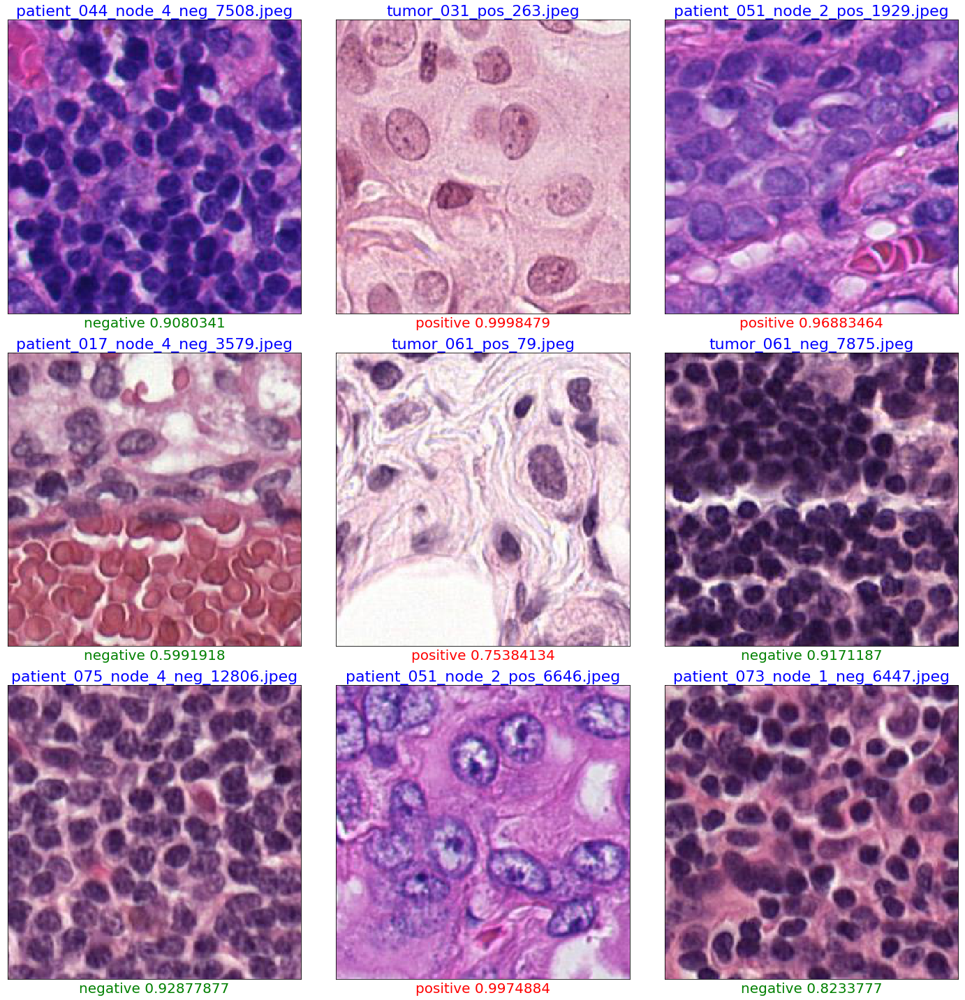

In [14]:
#Entrenamiento y evaluacion visual con imagenes reales
src_dir_train= constants.BASE_PATH + constants.DATA_PATH
src_dir_eval= "test_images/histo_l0/evaluation/real/"
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
src_dir_test= constants.BASE_PATH + constants.OUTPUT_PATH

model="evaluation/trained_models/incp_v3_5k_l0_real.pb"
labels="evaluation/labels.txt"

#Reentrenar inception con todo el dataset puede tomar bastante tiempo
#se pueden obtener precisiones similares con un set mucho mas pequeño y 
#con la consecuente reducción de tiempo.
test_accuracy = retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 5000)

In [15]:
#Primero vamos a evaluarlo con imagenes reales para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.8638
['N: 500 - Precision: 0.85', 'N: 1000 - Precision: 0.87', 'N: 2000 - Precision: 0.8605', 'N: 5000 - Precision: 0.8638']


In [16]:
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.7746
['N: 500 - Precision: 0.764', 'N: 1000 - Precision: 0.753', 'N: 2000 - Precision: 0.7805', 'N: 5000 - Precision: 0.7746']


## Entrenamiento con imagenes generadas: N=5000

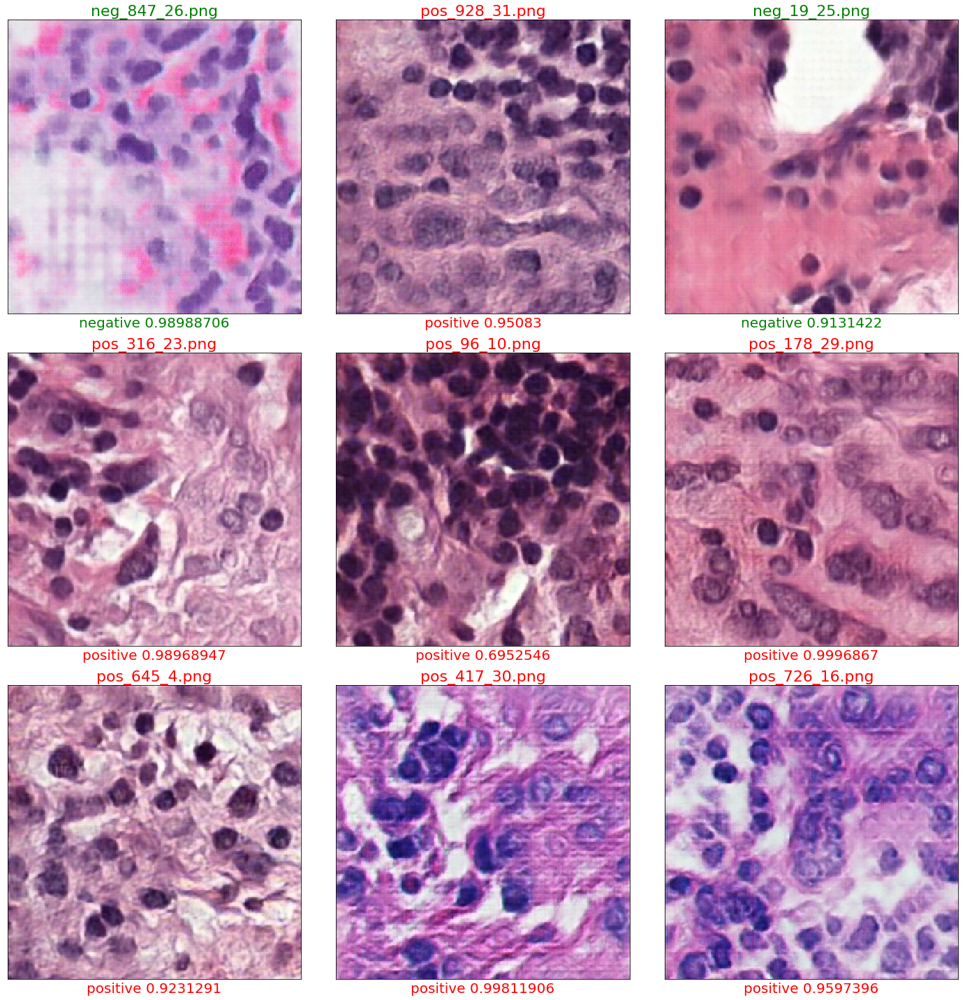

In [9]:
#Entrenamiento imagenes generadas
src_dir_train= constants.BASE_PATH + constants.OUTPUT_PATH
src_dir_eval= "test_images/histo_l0/evaluation/fake/"
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
src_dir_test= constants.BASE_PATH + constants.DATA_PATH
model="evaluation/trained_models/incp_v3_5k_l0_gen.pb"
labels="evaluation/labels.txt"

retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 5000)

In [10]:
#Primero vamos a evaluarlo con imagenes generadas para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9366
['N: 500 - Precision: 0.93', 'N: 5000 - Precision: 0.9366']


In [11]:
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.8032
['N: 500 - Precision: 0.796', 'N: 5000 - Precision: 0.8032']


## Entrenamiento con imagenes reales: N=15000

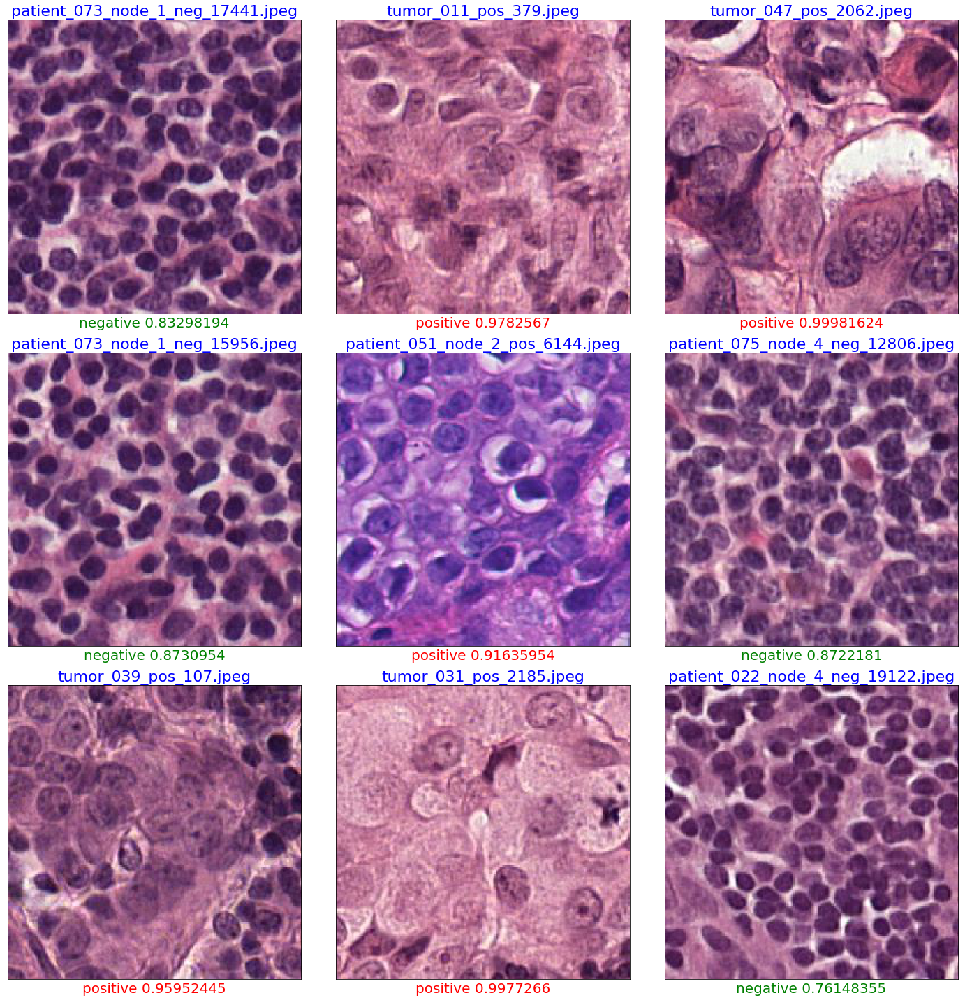

In [10]:
#Si encontramos problemas al ejecutar el notebook jupyter de una sola vez
#puede que necesitemos reiniciar el kernel debido a un problema con la liberacion de memoria por parte de la gpu

#Entrenamiento y evaluacion visual con imagenes reales
src_dir_train= constants.BASE_PATH + constants.DATA_PATH
src_dir_eval= "test_images/histo_l0/evaluation/real/"
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
src_dir_test= constants.BASE_PATH + constants.OUTPUT_PATH
model="evaluation/trained_models/incp_v3_15k_l0_real.pb"
labels="evaluation/labels.txt"

#Reentrenar inception con todo el dataset puede tomar bastante tiempo
#se pueden obtener precisiones similares con un set mucho mas pequeño y 
#con la consecuente reducción de tiempo.
test_accuracy = retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 15000)

In [11]:
#Primero vamos a evaluarlo con imagenes reales para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.873
['N: 500 - Precision: 0.882', 'N: 5000 - Precision: 0.873']


In [12]:
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.7984
['N: 500 - Precision: 0.78', 'N: 5000 - Precision: 0.7984']


## Entrenamiento con imagenes generadas: N=15000

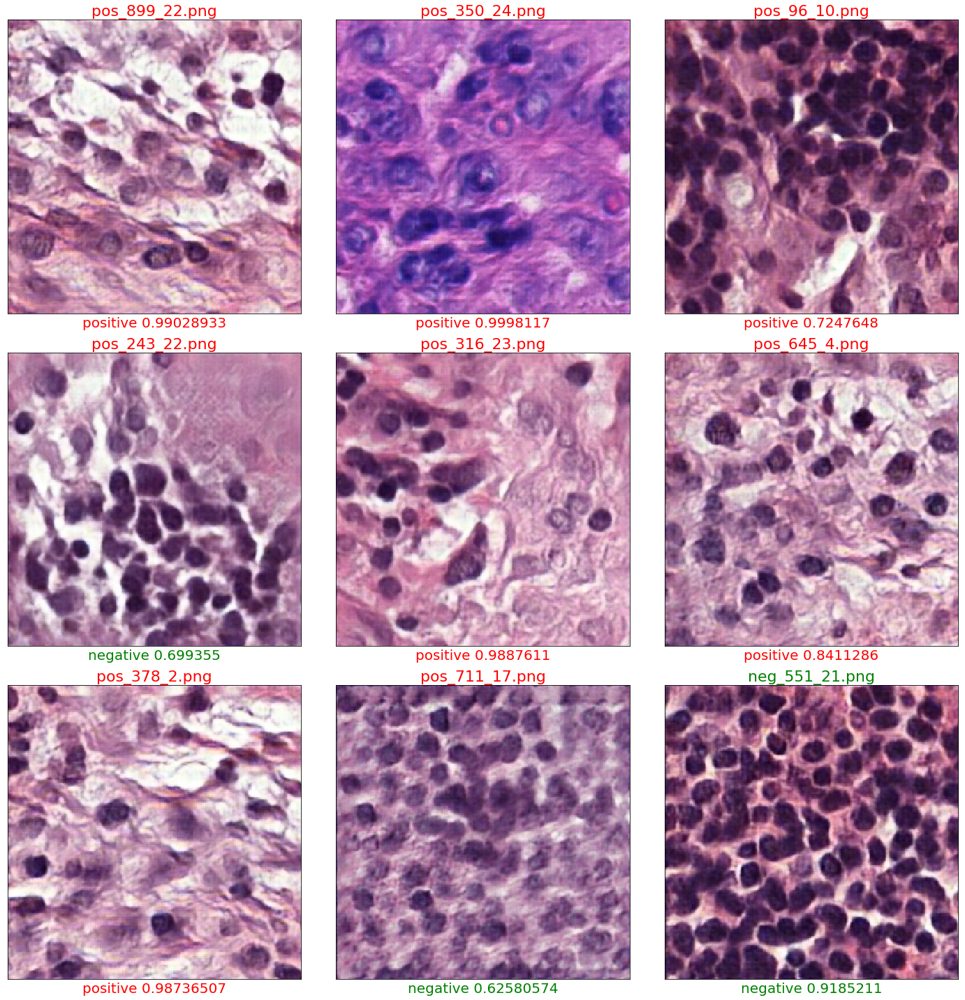

In [9]:
#Entrenamiento y evaluacion visual con imagenes generadas
src_dir_train= constants.BASE_PATH + constants.OUTPUT_PATH
src_dir_eval= "test_images/histo_l0/evaluation/fake/"
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
src_dir_test= constants.BASE_PATH + constants.DATA_PATH
model="evaluation/trained_models/incp_v3_15k_l0_gen.pb"
labels="evaluation/labels.txt"

retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 15000)

In [10]:
#Primero vamos a evaluarlo con imagenes generadas para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9436
['N: 500 - Precision: 0.96', 'N: 5000 - Precision: 0.9436']


In [11]:
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.8158
['N: 500 - Precision: 0.82', 'N: 5000 - Precision: 0.8158']


# Evaluacion de la red imagenes generadas a partir de la red entrenada con parches extraidos al nivel de zoom 1

In [8]:
dataset = "camelyon_17_16_level1"
change_active_config(dataset)
importlib.reload(constants)

<module 'constants' from '/home/ruben/Repositories/histo_bkp/histology_dcgan/constants.py'>

## Entrenamiento con imagenes reales: N=5000

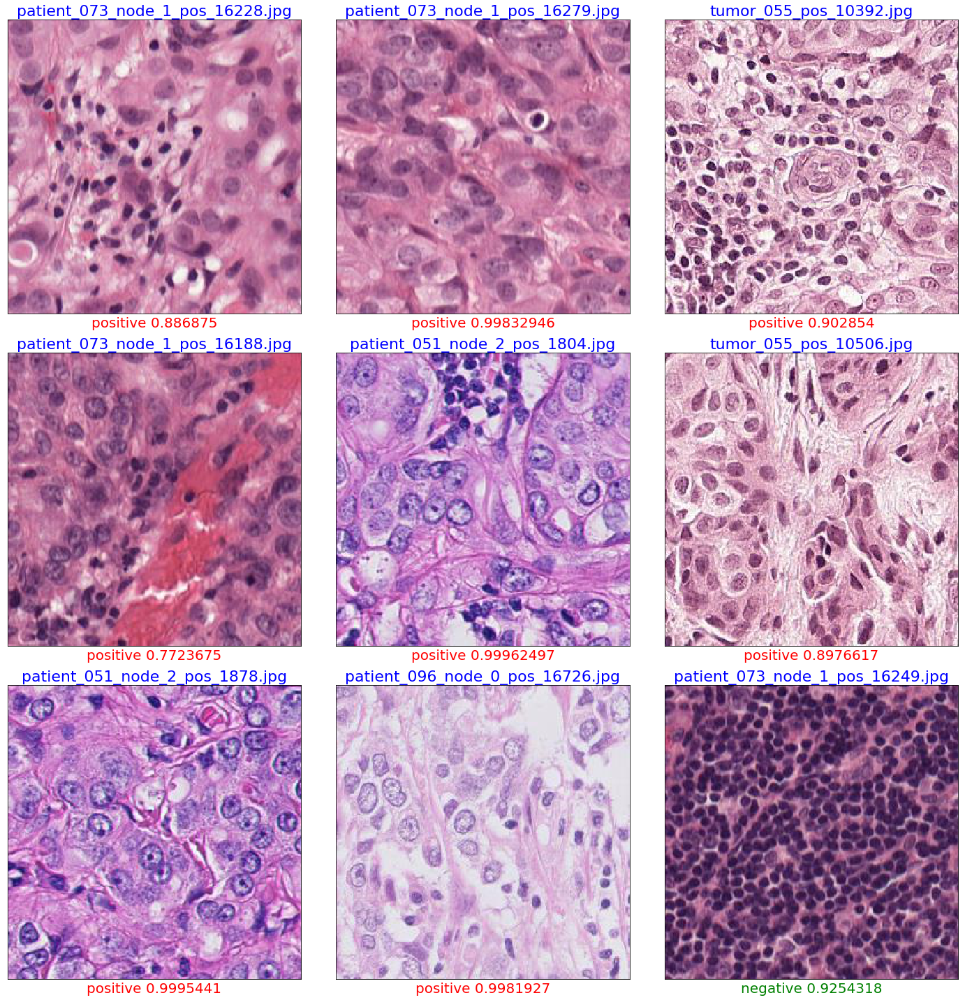

In [9]:
#Entrenamiento y evaluacion visual con imagenes reales
src_dir_train= constants.BASE_PATH + constants.DATA_PATH
src_dir_eval= "test_images/histo_l1/evaluation/real/"
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
src_dir_test= constants.BASE_PATH + constants.OUTPUT_PATH

model="evaluation/trained_models/incp_v3_5k_l1_real.pb"
labels="evaluation/labels.txt"

#Reentrenar inception con todo el dataset puede tomar bastante tiempo
#se pueden obtener precisiones similares con un set mucho mas pequeño y 
#con la consecuente reducción de tiempo.
test_accuracy = retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 5000)

In [10]:
#Primero vamos a evaluarlo con imagenes reales para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9096
['N: 500 - Precision: 0.904', 'N: 5000 - Precision: 0.9096']


In [11]:
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.8384
['N: 500 - Precision: 0.856', 'N: 5000 - Precision: 0.8384']


## Entrenamiento con imagenes generadas: N=5000

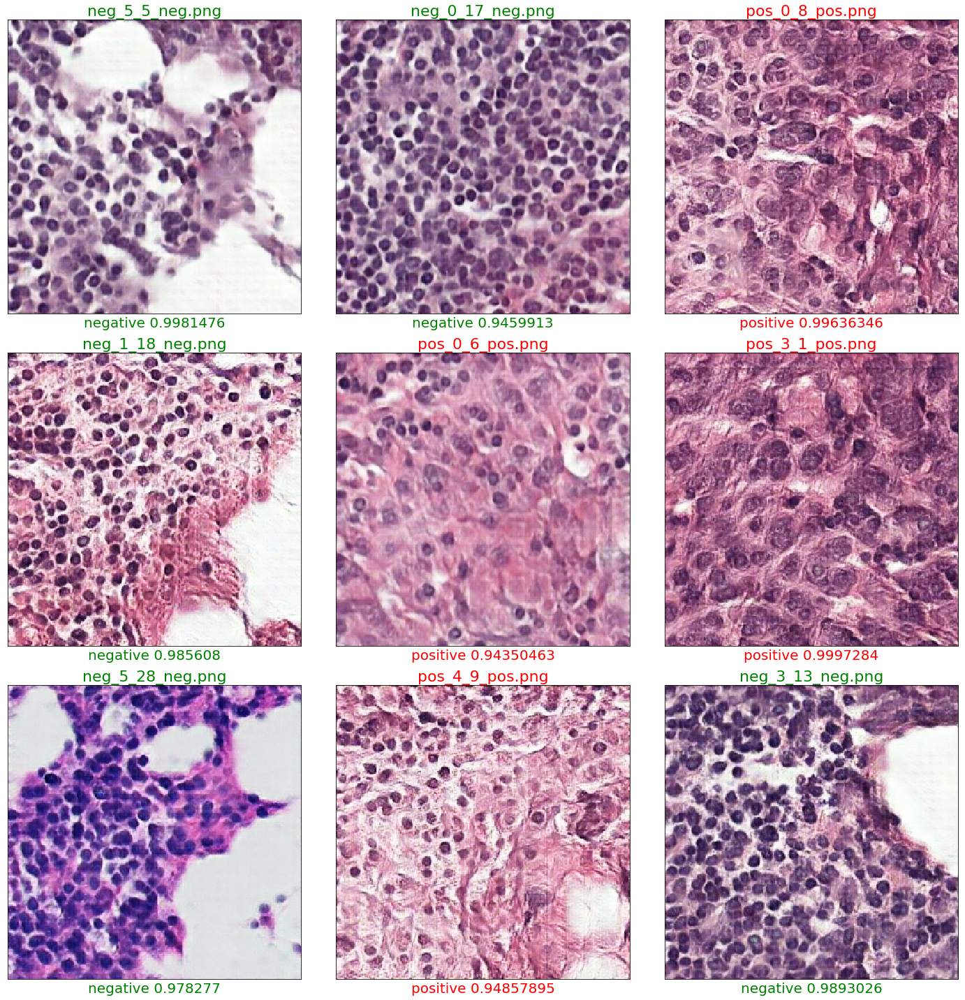

In [10]:
#Entrenamiento imagenes generadas
src_dir_train= constants.BASE_PATH + constants.OUTPUT_PATH
src_dir_eval= "test_images/histo_l1/evaluation/fake/"
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
src_dir_test= constants.BASE_PATH + constants.DATA_PATH
model="evaluation/trained_models/incp_v3_5k_l1_gen.pb"
labels="evaluation/labels.txt"

retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 5000)

In [10]:
#Primero vamos a evaluarlo con imagenes generadas para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9424
['N: 500 - Precision: 0.944', 'N: 5000 - Precision: 0.9424']


In [11]:
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.8536
['N: 500 - Precision: 0.848', 'N: 5000 - Precision: 0.8536']


## Entrenamiento con imagenes reales: N=15000

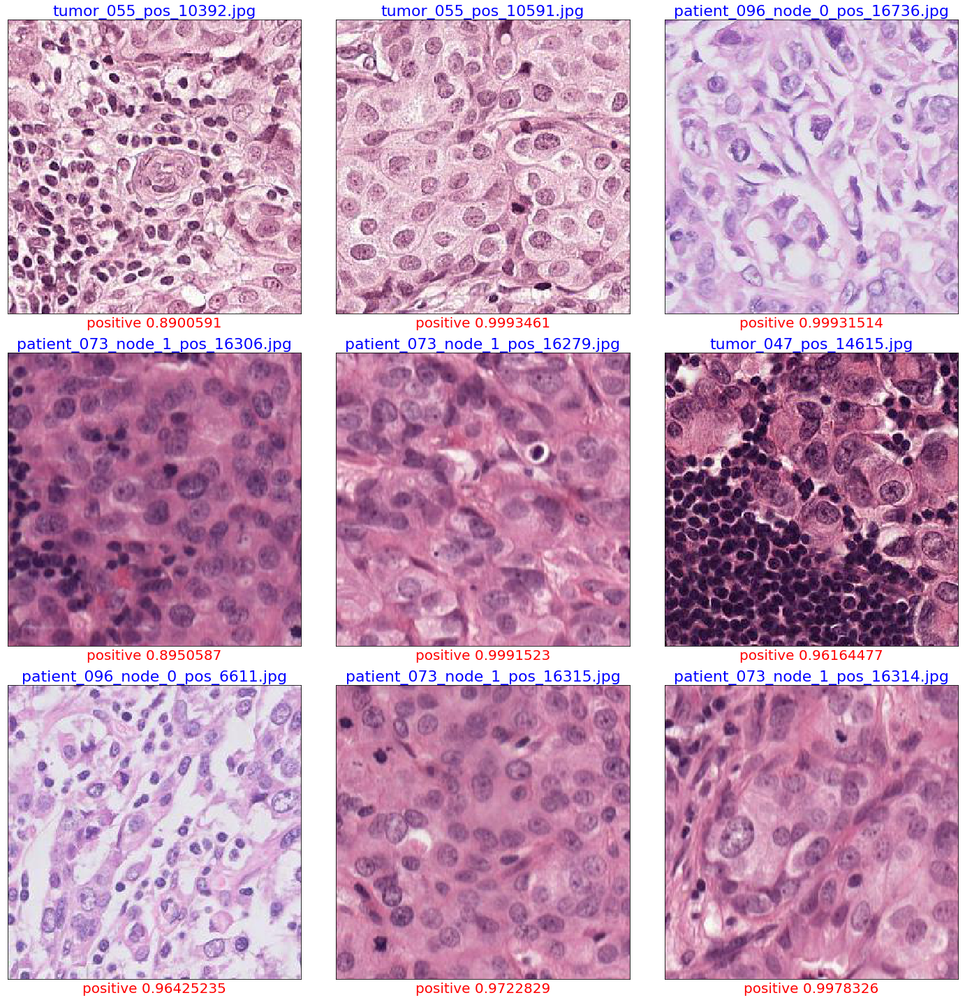

In [9]:
#Si encontramos problemas al ejecutar el notebook jupyter de una sola vez
#puede que necesitemos reiniciar el kernel debido a un problema con la liberacion de memoria por parte de la gpu

#Entrenamiento y evaluacion visual con imagenes reales
src_dir_train= constants.BASE_PATH + constants.DATA_PATH
src_dir_eval= "test_images/histo_l1/evaluation/real/"
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
src_dir_test= constants.BASE_PATH + constants.OUTPUT_PATH
model="evaluation/trained_models/incp_v3_15k_l1_real.pb"
labels="evaluation/labels.txt"

#Reentrenar inception con todo el dataset puede tomar bastante tiempo
#se pueden obtener precisiones similares con un set mucho mas pequeño y 
#con la consecuente reducción de tiempo.
test_accuracy = retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 15000)

In [10]:
#Primero vamos a evaluarlo con imagenes reales para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9006
['N: 500 - Precision: 0.896', 'N: 5000 - Precision: 0.9006']


In [11]:
#Hemos entrenado con imagenes reales y testeamos con imagenes generadas
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.821
['N: 500 - Precision: 0.798', 'N: 5000 - Precision: 0.821']


## Entrenamiento con imagenes generadas: N=15000

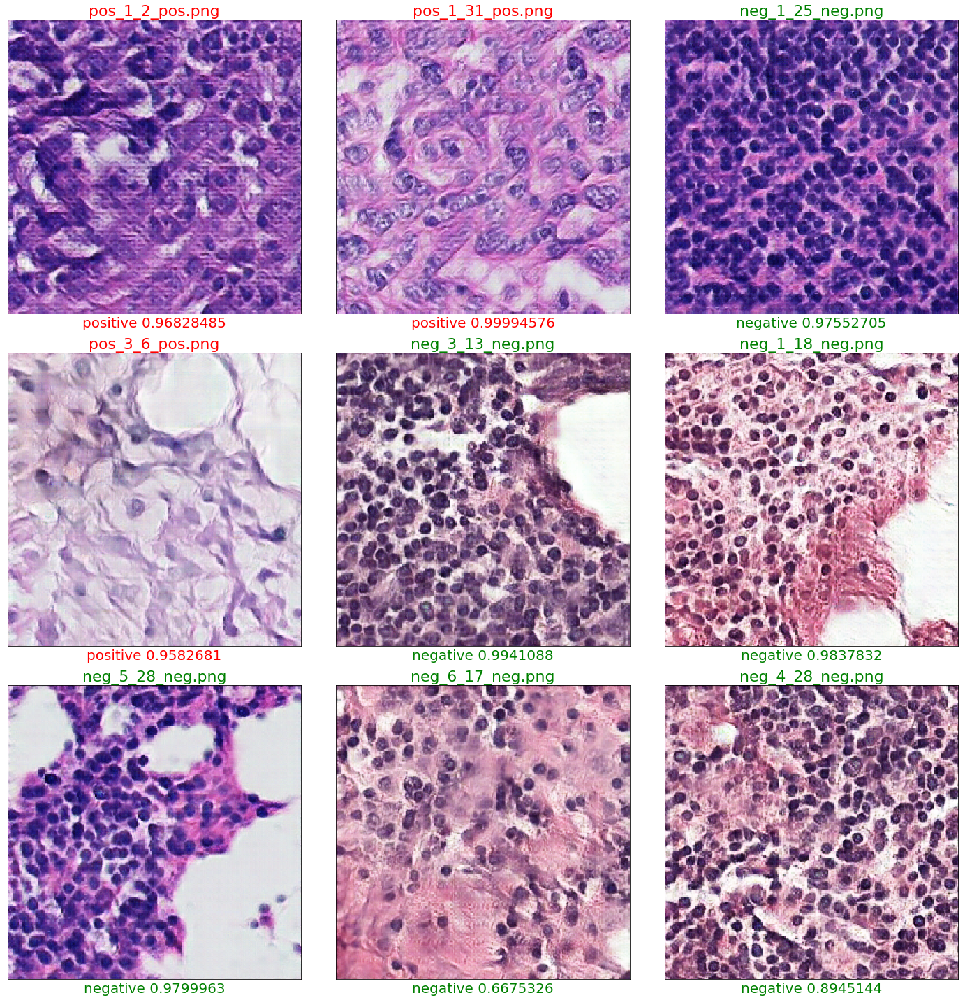

In [11]:
#Entrenamiento y evaluacion visual con imagenes generadas
src_dir_train= constants.BASE_PATH + constants.OUTPUT_PATH
src_dir_eval= "test_images/histo_l1/evaluation/fake/"
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
src_dir_test= constants.BASE_PATH + constants.DATA_PATH
model="evaluation/trained_models/incp_v3_15k_l1_gen.pb"
labels="evaluation/labels.txt"

retrain_and_evaluate(src_dir_train, src_dir_eval, model, labels, steps = 5000, no_imgs_per_class = 15000)

In [9]:
#Primero vamos a evaluarlo con imagenes generadas para tener una referencia
print(eval_accuracy(src_dir_train, model, labels))

Progreso: [####################] 100.0%
5000-0.9446
['N: 500 - Precision: 0.938', 'N: 5000 - Precision: 0.9446']


In [10]:
#Hemos entrenado con imagenes generadas y testeamos con imagenes reales
print(eval_accuracy(src_dir_test, model, labels))

Progreso: [####################] 100.0%
5000-0.8592
['N: 500 - Precision: 0.872', 'N: 5000 - Precision: 0.8592']
